# 1. NAV Performance Analysis

In [81]:
print("Notebook connected successfully!")

Notebook connected successfully!


In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

print("All libraries loaded successfully!")

All libraries loaded successfully!


In [8]:
import os

print(os.listdir("../data"))

['processed', 'raw']


In [9]:
import os

print(os.listdir("../data/processed"))


['01_fund_master_clean.csv', '03_aum_by_fund_house_clean.csv', '04_monthly_sip_inflows_clean.csv', '05_category_inflows_clean.csv', '06_industry_folio_count_clean.csv', '09_portfolio_holdings_clean.csv', '10_benchmark_indices_clean.csv', 'investor_transactions_clean.csv', 'nav_history_clean.csv', 'scheme_performance_clean.csv']


In [10]:
nav = pd.read_csv("../data/processed/nav_history_clean.csv")

In [11]:
nav.head()

,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639


In [ ]:
print(nav.shape)

print(nav.columns)

nav.info()

(46000, 3)
Index(['amfi_code', 'date', 'nav'], dtype='str')
<class 'pandas.DataFrame'>
RangeIndex: 46000 entries, 0 to 45999
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   amfi_code  46000 non-null  int64  
 1   date       46000 non-null  str    
 2   nav        46000 non-null  float64
dtypes: float64(1), int64(1), str(1)
memory usage: 1.1 MB


: 

In [12]:
nav.head(10)

,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639
5,100016,2022-01-10,510.7136
6,100016,2022-01-11,513.5542
7,100016,2022-01-12,512.3195
8,100016,2022-01-13,510.2445
9,100016,2022-01-14,514.3636


In [13]:
nav.sample(5)

,amfi_code,date,nav
20571,119095,2025-12-02,69.8813
2977,100033,2024-08-07,232.3342
36350,120844,2024-09-09,3806.1616
18010,119093,2024-12-02,49.5748
42821,149322,2023-01-17,372.5755


In [14]:
print(nav.columns)

Index(['amfi_code', 'date', 'nav'], dtype='str')


In [15]:
fund = pd.read_csv("../data/processed/01_fund_master_clean.csv")

fund.head()

,amfi_code,fund_house,scheme_name,category,sub_category,plan,launch_date,benchmark,expense_ratio_pct,exit_load_pct,min_sip_amount,min_lumpsum_amount,fund_manager,risk_category,sebi_category_code
0,119551,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
1,119552,SBI Mutual Fund,SBI Bluechip Fund - Direct Plan - Growth,Equity,Large Cap,Direct,2013-01-01,NIFTY 100 TRI,0.66,1.0,500,1000,Sohini Andani,Moderate,EC01
2,119598,SBI Mutual Fund,SBI Small Cap Fund - Regular Plan - Growth,Equity,Small Cap,Regular,2009-09-09,BSE 250 SmallCap TRI,1.43,1.0,500,1000,R. Srinivasan,Very High,EC03
3,119599,SBI Mutual Fund,SBI Small Cap Fund - Direct Plan - Growth,Equity,Small Cap,Direct,2013-01-01,BSE 250 SmallCap TRI,0.72,1.0,500,1000,R. Srinivasan,Very High,EC03
4,119120,SBI Mutual Fund,SBI Magnum Gilt Fund - Regular Plan - Growth,Debt,Gilt,Regular,2000-12-30,CRISIL Dynamic Gilt Index,0.77,0.0,500,1000,Dinesh Ahuja,Low,DC02


In [16]:
nav = pd.read_csv("../data/processed/nav_history_clean.csv")
fund = pd.read_csv("../data/processed/01_fund_master_clean.csv")

nav_merged = nav.merge(
    fund[['amfi_code','scheme_name']],
    on='amfi_code',
    how ='left'

)
nav_merged.head()

,amfi_code,date,nav,scheme_name
0,100016,2022-01-03,520.4608,HDFC Top 100 Fund - Regular Plan - Growth
1,100016,2022-01-04,515.0971,HDFC Top 100 Fund - Regular Plan - Growth
2,100016,2022-01-05,521.7239,HDFC Top 100 Fund - Regular Plan - Growth
3,100016,2022-01-06,515.7880,HDFC Top 100 Fund - Regular Plan - Growth
4,100016,2022-01-07,515.1639,HDFC Top 100 Fund - Regular Plan - Growth


In [ ]:
python(nav_merged.columns)

NameError: name 'python' is not defined

: 

In [17]:
print(nav_merged.columns)

Index(['amfi_code', 'date', 'nav', 'scheme_name'], dtype='str')


In [18]:
print(nav_merged['scheme_name'].nunique())

40


In [19]:
print(nav_merged['scheme_name'].nunique())

40


In [20]:
nav_merged["date"] = pd.to_datetime(nav_merged["date"])

In [ ]:
%pip install plotly

Note: you may need to restart the kernel to use updated packages.


: 

In [21]:
import plotly.express as px

fig = px.line(
    nav_merged,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV Trend of 40 Mutual Fund Schemes (2022–2026)"
)

fig.show()

In [22]:
import plotly.express as px

fig = px.line(
    nav_merged,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV Trend of 40 Mutual Fund Schemes (2022–2026)",
    height=700,
    width=1200
)

fig.update_layout(
    legend_title="Scheme Name",
    xaxis_title="Date",
    yaxis_title="NAV",
    hovermode="x unified"
)

fig.show()

In [23]:
nav_merged.groupby("scheme_name")["nav"].max().sort_values(ascending=False).head(10)

scheme_name
Kotak Liquid Fund - Regular - Growth                 4268.5497
HDFC Top 100 Fund - Direct Plan - Growth             1286.0621
ABSL Frontline Equity Fund - Regular - Growth         808.0982
HDFC Top 100 Fund - Regular Plan - Growth             669.7236
DSP Top 100 Equity Fund - Regular - Growth            658.5042
Kotak Bluechip Fund - Regular - Growth                484.6292
ICICI Pru Midcap Fund - Regular - Growth              476.3696
UTI Flexi Cap Fund - Regular - Growth                 419.3008
ICICI Pru Value Discovery Fund - Regular - Growth     410.2909
ABSL Liquid Fund - Regular - Growth                   410.1021
Name: nav, dtype: float64

In [24]:
nav_normalized = nav_merged.copy()

nav_normalized["normalized_nav"] = (
    nav_normalized.groupby("scheme_name")["nav"]
    .transform(lambda x: (x / x.iloc[0]) * 100)
)

In [25]:
fig = px.line(
    nav_normalized,
    x="date",
    y="normalized_nav",
    color="scheme_name",
    title="Normalized NAV Performance of 40 Schemes (Base = 100)",
    height=700
)

fig.show()

In [26]:
fig = px.line(
    nav_normalized,
    x="date",
    y="normalized_nav",
    color="scheme_name",
    title="Normalized NAV Performance of 40 Mutual Fund Schemes (Base = 100)",
    height=700,
    width=1200
)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Normalized NAV Index",
    hovermode="x unified"
)

fig.show()

In [27]:
fig.write_image("../reports/normalized_nav_performance.png")

In [ ]:
%pip install -U kaleido


   ---------------------------------------- 0/5 [simplejson]
   -------- ------------------------------- 1/5 [orjson]
   ------------------------ --------------- 3/5 [choreographer]
   ------------------------ --------------- 3/5 [choreographer]
   -------------------------------- ------- 4/5 [kaleido]
   ---------------------------------------- 5/5 [kaleido]

Note: you may need to restart the kernel to use updated packages.


: 

In [29]:
fig.write_image("../reports/normalized_nav_performance.png")

In [ ]:
pip install -upgrade kaleido

Note: you may need to restart the kernel to use updated packages.



[optparse.groups]Usage:[/]   
  c:\data\capstone_project\venv\Scripts\python.exe -m pip install \[options] <requirement specifier> \[package-index-options] ...
  c:\data\capstone_project\venv\Scripts\python.exe -m pip install \[options] -r <requirements file> \[package-index-options] ...
  c:\data\capstone_project\venv\Scripts\python.exe -m pip install \[options] [-e] <vcs project url> ...
  c:\data\capstone_project\venv\Scripts\python.exe -m pip install \[options] [-e] <local project path> ...
  c:\data\capstone_project\venv\Scripts\python.exe -m pip install \[options] <archive url/path> ...

no such option: -u


: 

In [30]:
import pandas as pd
import numpy as np
import plotly.express as px

In [31]:
nav = pd.read_csv("../data/processed/nav_history_clean.csv")
fund = pd.read_csv("../data/processed/01_fund_master_clean.csv")

nav_merged = nav.merge(
    fund[['amfi_code', 'scheme_name']],
    on='amfi_code',
    how='left'
)

nav_merged["date"] = pd.to_datetime(nav_merged["date"])

In [33]:
nav_normalized = nav_merged.copy()

nav_normalized["normalized_nav"] = (
    nav_normalized.groupby("scheme_name")["nav"]
    .transform(lambda x: x / x.iloc[0] * 100)
)

In [34]:
nav_normalized = nav_merged.copy()

nav_normalized["normalized_nav"] = (
    nav_normalized.groupby("scheme_name")["nav"]
    .transform(lambda x: x / x.iloc[0] * 100)
)

In [35]:
fig = px.line(
    nav_normalized,
    x="date",
    y="normalized_nav",
    color="scheme_name",
    title="Normalized NAV Performance of 40 Mutual Fund Schemes (Base = 100)",
    height=700,
    width=1200
)

fig.show()

In [36]:
fig.write_image("../reports/normalized_nav_performance.png")

# 2. Assets Under Management Analysis

In [37]:
aum = pd.read_csv("../data/processed/03_aum_by_fund_house_clean.csv")

aum.head()

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168


In [38]:
print(aum.columns)

print(aum.shape)

aum.info()

Index(['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes'], dtype='str')
(90, 5)
<class 'pandas.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            90 non-null     str    
 1   fund_house      90 non-null     str    
 2   aum_lakh_crore  90 non-null     float64
 3   aum_crore       90 non-null     int64  
 4   num_schemes     90 non-null     int64  
dtypes: float64(1), int64(2), str(2)
memory usage: 3.6 KB


In [39]:
aum.head(10)

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168
5,2022-03-31,Aditya Birla Sun Life MF,2.78,278000,199
6,2022-03-31,Axis Mutual Fund,2.50,250000,95
7,2022-03-31,UTI Mutual Fund,2.30,230000,142
8,2022-03-31,Mirae Asset MF,1.05,105000,56
9,2022-03-31,DSP Mutual Fund,1.10,110000,88


In [40]:
print(aum.columns)

Index(['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes'], dtype='str')


In [41]:
aum.head()

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168


In [42]:
aum["date"].head()

0    2022-03-31
1    2022-03-31
2    2022-03-31
3    2022-03-31
4    2022-03-31
Name: date, dtype: str

In [43]:
aum["date"] = pd.to_datetime(aum["date"])
aum["year"] = aum["date"].dt.year

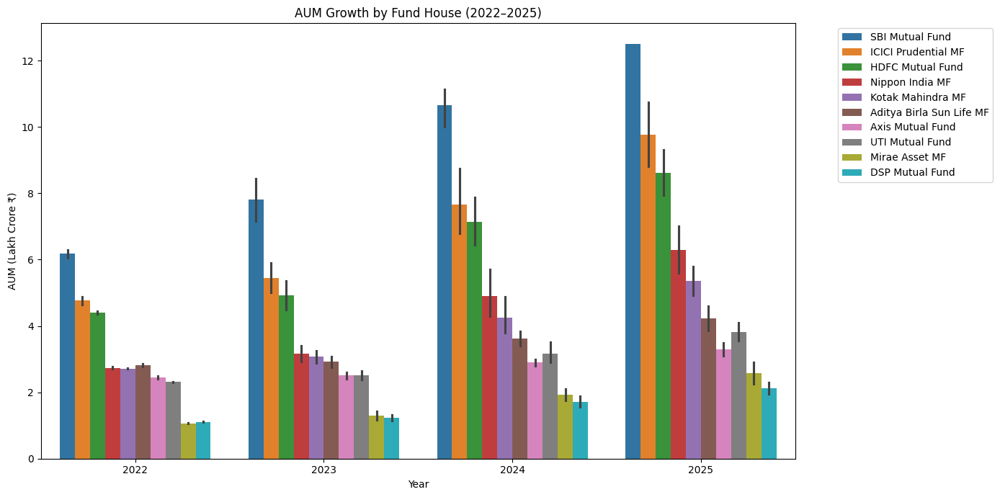

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,7))

sns.barplot(
    data=aum,
    x="year",
    y="aum_lakh_crore",
    hue="fund_house"
)

plt.title("AUM Growth by Fund House (2022–2025)")
plt.xlabel("Year")
plt.ylabel("AUM (Lakh Crore ₹)")
plt.xticks(rotation=0)

plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()

plt.show()

In [45]:
aum[aum["fund_house"].str.contains("SBI", case=False)]

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes,year
0,2022-03-31,SBI Mutual Fund,6.05,605000,186,2022
10,2022-09-30,SBI Mutual Fund,6.30,630000,186,2022
20,2023-03-31,SBI Mutual Fund,7.17,717000,186,2023
30,2023-09-30,SBI Mutual Fund,8.45,845000,186,2023
40,2024-03-31,SBI Mutual Fund,10.00,1000000,186,2024
50,2024-09-30,SBI Mutual Fund,10.80,1080000,186,2024
60,2024-12-31,SBI Mutual Fund,11.14,1114000,186,2024
70,2025-03-31,SBI Mutual Fund,12.50,1250000,186,2025
80,2025-12-31,SBI Mutual Fund,12.50,1250000,186,2025


In [46]:
plt.savefig("../reports/aum_growth.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

## Insight 3

SBI Mutual Fund maintained the highest Assets Under Management (AUM) among all fund houses during the study period. The consistent growth in AUM indicates strong investor confidence and market leadership compared to competing fund houses.

**Chart Reference:** AUM Growth by Fund House (Chart 2)

In [47]:
sip = pd.read_csv("../data/processed/04_monthly_sip_inflows_clean.csv")

sip.head()

,month,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,2022-01,11517,4.91,9.10,4.80,NaN
1,2022-02,11438,4.93,8.20,4.85,NaN
2,2022-03,12328,5.09,10.50,5.01,NaN
3,2022-04,11863,5.48,9.52,5.12,NaN
4,2022-05,12286,5.55,8.10,5.15,NaN


In [48]:
print(sip.columns)

Index(['month', 'sip_inflow_crore', 'active_sip_accounts_crore',
       'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct'],
      dtype='str')


In [49]:
sip.info()

<class 'pandas.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   month                      48 non-null     str    
 1   sip_inflow_crore           48 non-null     int64  
 2   active_sip_accounts_crore  48 non-null     float64
 3   new_sip_accounts_lakh      48 non-null     float64
 4   sip_aum_lakh_crore         48 non-null     float64
 5   yoy_growth_pct             36 non-null     float64
dtypes: float64(4), int64(1), str(1)
memory usage: 2.4 KB


In [50]:
print(sip.columns)

Index(['month', 'sip_inflow_crore', 'active_sip_accounts_crore',
       'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct'],
      dtype='str')


In [51]:
sip["month"] = pd.to_datetime(sip["month"])

In [52]:
import plotly.express as px

fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    title="Monthly SIP Inflows (2022–2025)",
    markers=True
)

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="SIP Inflow (₹ Crore)",
    hovermode="x unified"
)

fig.show()

In [53]:
sip.loc[sip["sip_inflow_crore"].idxmax()]

month                        2025-12-01 00:00:00
sip_inflow_crore                           31002
active_sip_accounts_crore                   9.35
new_sip_accounts_lakh                        9.8
sip_aum_lakh_crore                          15.9
yoy_growth_pct                             17.17
Name: 47, dtype: object

In [54]:
max_row = sip.loc[sip["sip_inflow_crore"].idxmax()]

fig.add_annotation(
    x=max_row["month"],
    y=max_row["sip_inflow_crore"],
    text=f"All-Time High ₹{max_row['sip_inflow_crore']:,.0f} Cr",
    showarrow=True,
    arrowhead=2
)

fig.show()

In [55]:
fig.write_image("../reports/sip_inflow_trend.png")

TypeError: Type is not JSON serializable: Timestamp

In [ ]:
fig.write_image("../reports/sip_inflow_trend.png")

TypeError: Type is not JSON serializable: Timestamp

: 

In [56]:
max_row = sip.loc[sip["sip_inflow_crore"].idxmax()]

fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    title="Monthly SIP Inflows (2022–2025)",
    markers=True
)

fig.add_annotation(
    x=str(max_row["month"].date()),   # convert Timestamp to string
    y=float(max_row["sip_inflow_crore"]),
    text=f"All-Time High ₹{max_row['sip_inflow_crore']:,.0f} Cr",
    showarrow=True,
    arrowhead=2
)

fig.show()

In [57]:
fig.write_image("../reports/sip_inflow_trend.png")

In [59]:
print(type(max_row["month"]))
print(max_row["month"])

<class 'pandas.Timestamp'>
2025-12-01 00:00:00


In [60]:
sip["month"] = pd.to_datetime(sip["month"])
sip["month_str"] = sip["month"].dt.strftime("%Y-%m-%d")

In [61]:
import plotly.express as px

max_row = sip.loc[sip["sip_inflow_crore"].idxmax()]

fig = px.line(
    sip,
    x="month_str",
    y="sip_inflow_crore",
    title="Monthly SIP Inflows (2022–2025)",
    markers=True
)

fig.add_annotation(
    x=max_row["month_str"],
    y=max_row["sip_inflow_crore"],
    text=f"All-Time High ₹{max_row['sip_inflow_crore']:,.0f} Cr",
    showarrow=True,
    arrowhead=2
)

fig.show()

In [62]:
fig.write_image("../reports/sip_inflow_trend.png")

In [63]:
category = pd.read_csv("../data/processed/05_category_inflows_clean.csv")
print(category.columns)

Index(['month', 'category', 'net_inflow_crore'], dtype='str')


In [64]:
category.head()

,month,category,net_inflow_crore
0,2024-04,Large Cap,2413.0
1,2024-04,Mid Cap,3897.0
2,2024-04,Small Cap,3533.0
3,2024-04,Flexi Cap,4947.0
4,2024-04,Large & Mid Cap,4214.0


In [65]:
category["month"] = pd.to_datetime(category["month"])

# 4. Category-wise Inflow Analysis

In [66]:
heatmap_data = category.pivot(
    index="category",
    columns="month",
    values="net_inflow_crore"
)

heatmap_data.head()

month,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01
category,,,,,,,,,,,,
ELSS,466.0,553.0,472.0,471.0,499.0,537.0,537.0,571.0,521.0,516.0,437.0,500.0
Flexi Cap,4947.0,5529.0,4478.0,4869.0,5562.0,5397.0,6004.0,6111.0,4654.0,5603.0,6068.0,4767.0
Gilt,784.0,836.0,864.0,959.0,952.0,925.0,898.0,704.0,831.0,744.0,942.0,956.0
Hybrid,2955.0,3487.0,3163.0,3291.0,3684.0,3015.0,3314.0,3264.0,3538.0,2967.0,3360.0,2830.0
Large & Mid Cap,4214.0,4368.0,4610.0,5023.0,5411.0,4528.0,4581.0,5556.0,4878.0,4816.0,5524.0,4243.0


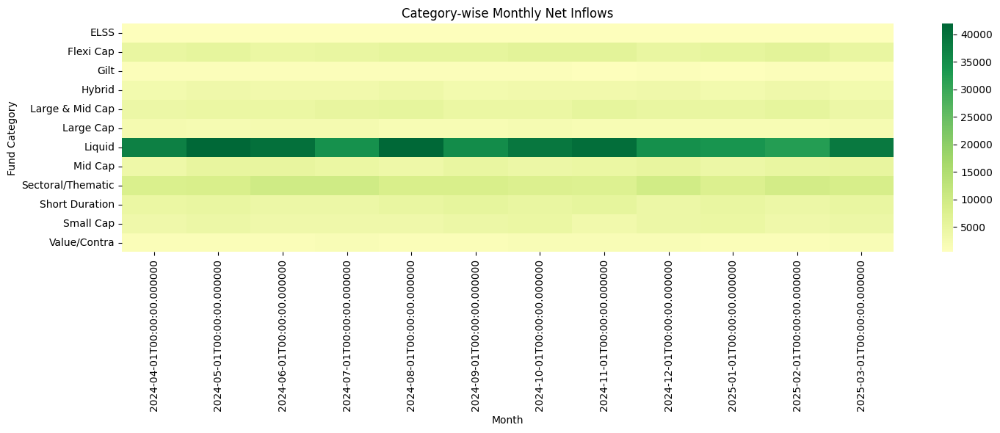

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,6))

sns.heatmap(
    heatmap_data,
    cmap="RdYlGn",
    center=0
)

plt.title("Category-wise Monthly Net Inflows")
plt.xlabel("Month")
plt.ylabel("Fund Category")

plt.tight_layout()
plt.show()

In [68]:
plt.savefig(
    "../reports/category_inflow_heatmap.png",
    bbox_inches="tight"
)

<Figure size 640x480 with 0 Axes>

## Insight 5

Equity-oriented mutual fund categories consistently attracted positive net inflows during the study period, while debt-oriented categories experienced periods of lower investor interest and occasional outflows.

**Chart Reference:** Category-wise Net Inflow Heatmap (Chart 5)

In [69]:
investor = pd.read_csv("../data/processed/investor_transactions_clean.csv")

print(investor.columns)
print(investor.head())

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')
  investor_id transaction_date  amfi_code transaction_type  amount_inr  \
0   INV003054       2024-01-01     119092              SIP        1834   
1   INV002952       2024-01-01     148567       REDEMPTION      392882   
2   INV003420       2024-01-01     118636              SIP         912   
3   INV003436       2024-01-01     118634              SIP        1102   
4   INV004691       2024-01-01     119094          LUMPSUM        8682   

         state       city city_tier age_group  gender  annual_income_lakh  \
0    Telangana  Hyderabad       T30       56+  Female                77.1   
1       Punjab   Amritsar       B30     18-25    Male                 7.1   
2      Haryana  Faridabad       B30     36-45    Male                47.2   
3  Maharashtra     

In [70]:
print(investor.columns)
print(investor.head())

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')
  investor_id transaction_date  amfi_code transaction_type  amount_inr  \
0   INV003054       2024-01-01     119092              SIP        1834   
1   INV002952       2024-01-01     148567       REDEMPTION      392882   
2   INV003420       2024-01-01     118636              SIP         912   
3   INV003436       2024-01-01     118634              SIP        1102   
4   INV004691       2024-01-01     119094          LUMPSUM        8682   

         state       city city_tier age_group  gender  annual_income_lakh  \
0    Telangana  Hyderabad       T30       56+  Female                77.1   
1       Punjab   Amritsar       B30     18-25    Male                 7.1   
2      Haryana  Faridabad       B30     36-45    Male                47.2   
3  Maharashtra     

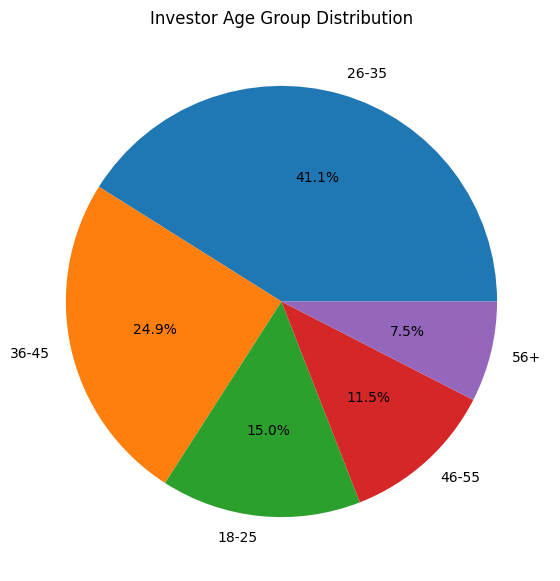

In [71]:
import matplotlib.pyplot as plt

age_counts = investor["age_group"].value_counts()

plt.figure(figsize=(7,7))
plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct="%1.1f%%"
)

plt.title("Investor Age Group Distribution")
plt.show()

## Insight 5

The majority of mutual fund investors belong to the working-age population, indicating strong participation from individuals in their prime earning years.

**Chart Reference:** Age Group Distribution (Chart 5)

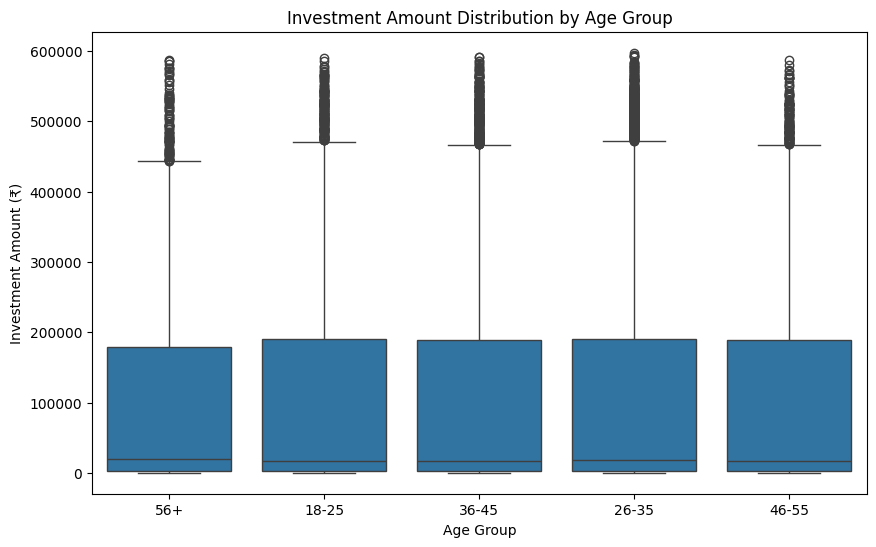

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.boxplot(
    data=investor,
    x="age_group",
    y="amount_inr"
)

plt.title("Investment Amount Distribution by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Investment Amount (₹)")
plt.show()

## Insight 6

Investment amounts vary across age groups, with older investors generally showing higher transaction values than younger investors.

**Chart Reference:** Investment Amount by Age Group (Chart 6)

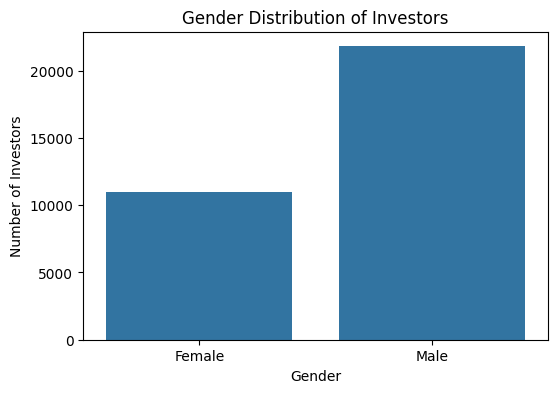

In [73]:
plt.figure(figsize=(6,4))

sns.countplot(
    data=investor,
    x="gender"
)

plt.title("Gender Distribution of Investors")
plt.xlabel("Gender")
plt.ylabel("Number of Investors")

plt.show()

## Insight 7

The investor base shows participation from both genders, reflecting the increasing accessibility and adoption of mutual fund investing across demographic groups.

**Chart Reference:** Gender Distribution (Chart 7)

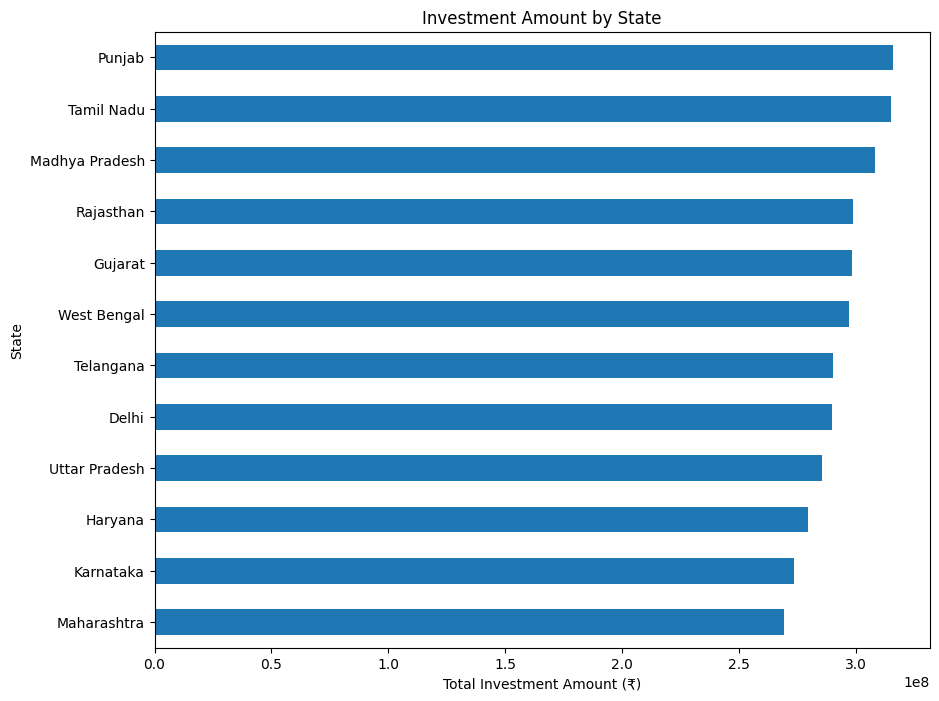

In [74]:
state_data = (
    investor.groupby("state")["amount_inr"]
    .sum()
    .sort_values(ascending=True)
)

plt.figure(figsize=(10,8))

state_data.plot(kind="barh")

plt.title("Investment Amount by State")
plt.xlabel("Total Investment Amount (₹)")
plt.ylabel("State")

plt.show()

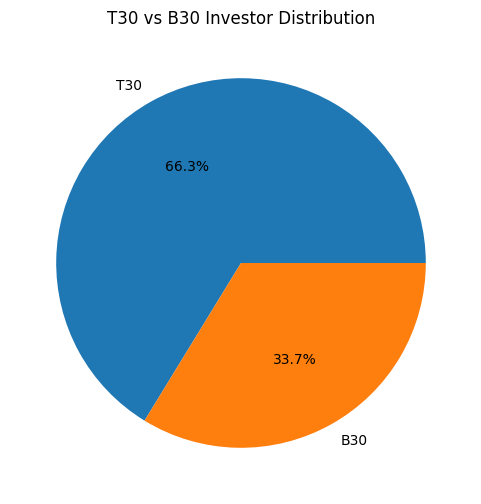

In [75]:
tier_counts = investor["city_tier"].value_counts()

plt.figure(figsize=(6,6))

plt.pie(
    tier_counts,
    labels=tier_counts.index,
    autopct="%1.1f%%"
)

plt.title("T30 vs B30 Investor Distribution")

plt.show()

## Insight 8

T30 cities contribute a significant share of mutual fund investments, although participation from B30 cities continues to expand steadily.

**Chart Reference:** T30 vs B30 Distribution (Chart 9)

In [76]:
folio = pd.read_csv("../data/processed/06_industry_folio_count_clean.csv")

print(folio.columns)
folio.head()

Index(['month', 'total_folios_crore', 'equity_folios_crore',
       'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore'],
      dtype='str')


,month,total_folios_crore,equity_folios_crore,debt_folios_crore,hybrid_folios_crore,others_folios_crore
0,2022-01,13.26,9.28,1.86,0.80,1.33
1,2022-04,13.91,9.74,1.95,0.83,1.39
2,2022-07,13.85,9.69,1.94,0.83,1.38
3,2022-10,14.12,9.88,1.98,0.85,1.41
4,2023-01,14.81,10.37,2.07,0.89,1.48


In [77]:
folio["month"] = pd.to_datetime(folio["month"])

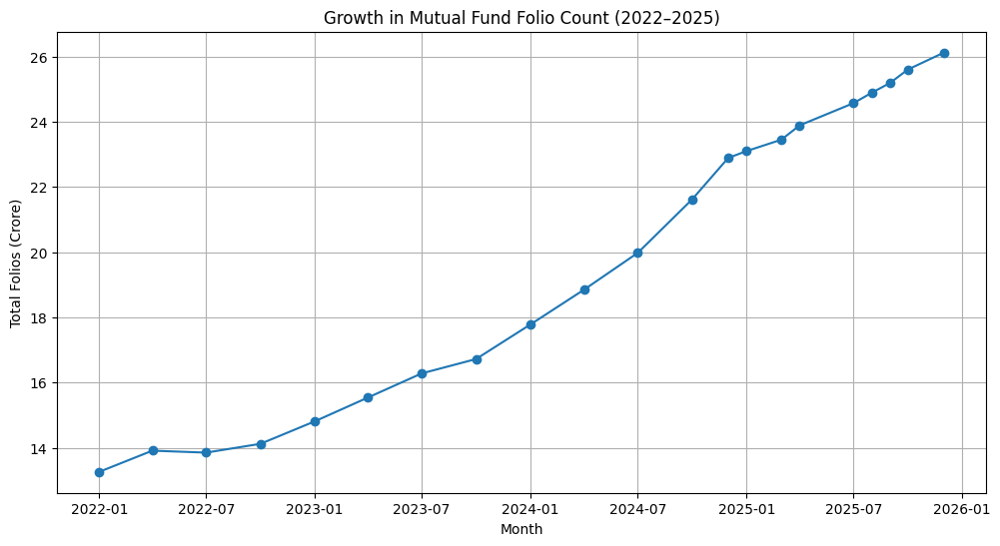

In [78]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    marker="o"
)

plt.title("Growth in Mutual Fund Folio Count (2022–2025)")
plt.xlabel("Month")
plt.ylabel("Total Folios (Crore)")
plt.grid(True)

plt.show()

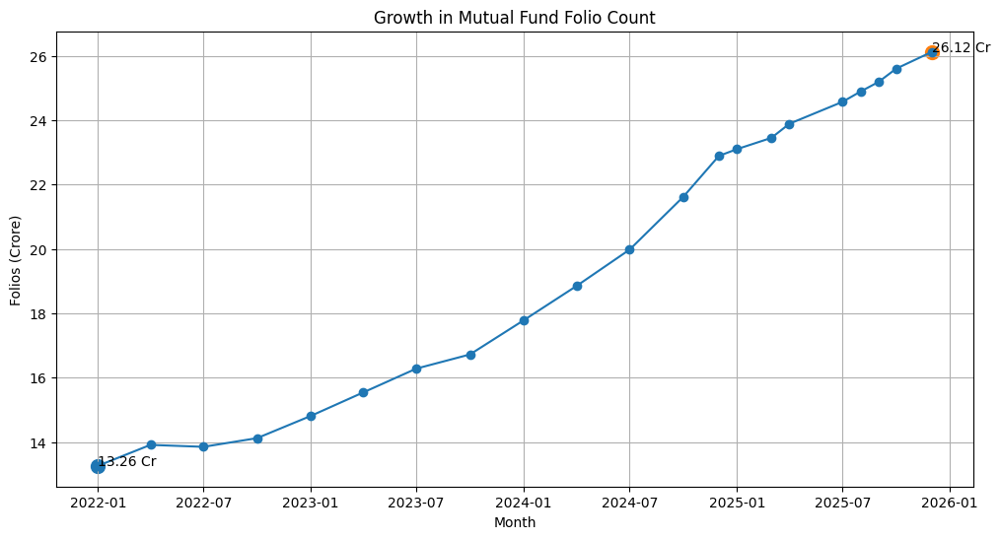

In [79]:
plt.figure(figsize=(12,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    marker="o"
)

# First point
first = folio.iloc[0]
last = folio.iloc[-1]

plt.scatter(first["month"], first["total_folios_crore"], s=100)
plt.scatter(last["month"], last["total_folios_crore"], s=100)

plt.annotate(
    f'{first["total_folios_crore"]:.2f} Cr',
    (first["month"], first["total_folios_crore"])
)

plt.annotate(
    f'{last["total_folios_crore"]:.2f} Cr',
    (last["month"], last["total_folios_crore"])
)

plt.title("Growth in Mutual Fund Folio Count")
plt.xlabel("Month")
plt.ylabel("Folios (Crore)")
plt.grid(True)

plt.show()

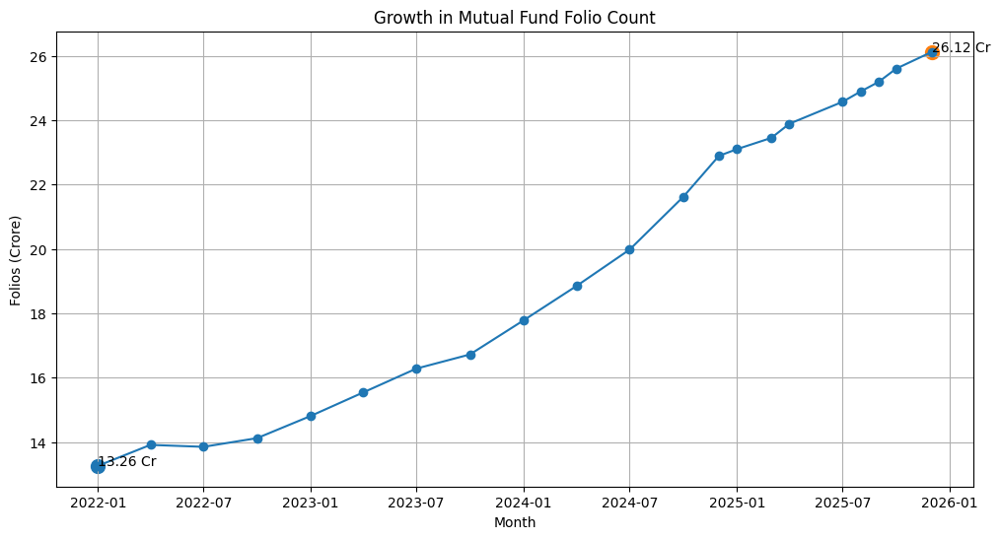

In [80]:
plt.figure(figsize=(12,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    marker="o"
)

# First point
first = folio.iloc[0]
last = folio.iloc[-1]

plt.scatter(first["month"], first["total_folios_crore"], s=100)
plt.scatter(last["month"], last["total_folios_crore"], s=100)

plt.annotate(
    f'{first["total_folios_crore"]:.2f} Cr',
    (first["month"], first["total_folios_crore"])
)

plt.annotate(
    f'{last["total_folios_crore"]:.2f} Cr',
    (last["month"], last["total_folios_crore"])
)

plt.title("Growth in Mutual Fund Folio Count")
plt.xlabel("Month")
plt.ylabel("Folios (Crore)")
plt.grid(True)

plt.show()

In [81]:
plt.savefig(
    "../reports/folio_growth.png",
    bbox_inches="tight"
)

<Figure size 640x480 with 0 Axes>

## Insight 9

Mutual fund folio counts increased steadily throughout the study period, reflecting strong growth in investor participation and increasing adoption of mutual fund products.

**Chart Reference:** Folio Count Growth (Chart 10)

In [82]:
nav_merged.head()

,amfi_code,date,nav,scheme_name
0,100016,2022-01-03,520.4608,HDFC Top 100 Fund - Regular Plan - Growth
1,100016,2022-01-04,515.0971,HDFC Top 100 Fund - Regular Plan - Growth
2,100016,2022-01-05,521.7239,HDFC Top 100 Fund - Regular Plan - Growth
3,100016,2022-01-06,515.7880,HDFC Top 100 Fund - Regular Plan - Growth
4,100016,2022-01-07,515.1639,HDFC Top 100 Fund - Regular Plan - Growth


In [83]:
nav_merged.head()

,amfi_code,date,nav,scheme_name
0,100016,2022-01-03,520.4608,HDFC Top 100 Fund - Regular Plan - Growth
1,100016,2022-01-04,515.0971,HDFC Top 100 Fund - Regular Plan - Growth
2,100016,2022-01-05,521.7239,HDFC Top 100 Fund - Regular Plan - Growth
3,100016,2022-01-06,515.7880,HDFC Top 100 Fund - Regular Plan - Growth
4,100016,2022-01-07,515.1639,HDFC Top 100 Fund - Regular Plan - Growth


In [84]:
nav_matrix = nav_merged.pivot(
    index="date",
    columns="scheme_name",
    values="nav"
)

In [85]:
returns = nav_matrix.pct_change()

In [86]:
selected_returns = returns.iloc[:, :10]

In [87]:
corr_matrix = selected_returns.corr()

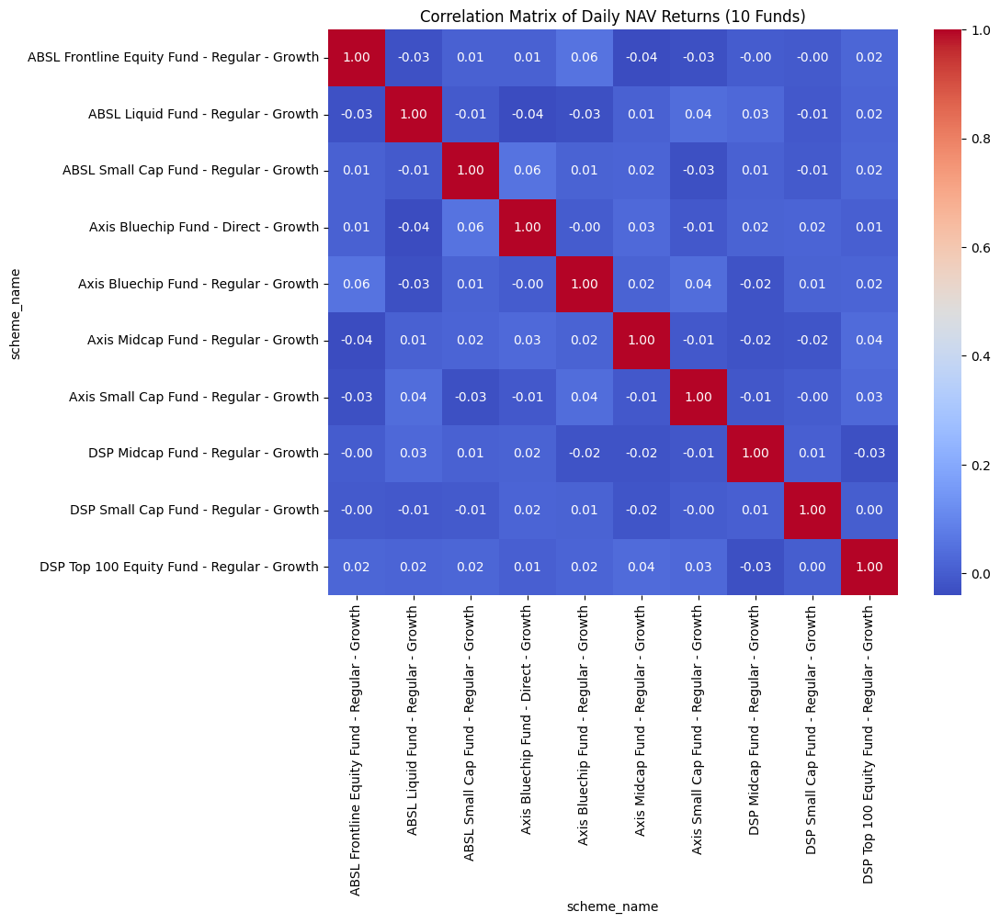

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)

plt.title("Correlation Matrix of Daily NAV Returns (10 Funds)")
plt.show()

In [89]:
plt.savefig(
    "../reports/nav_correlation_heatmap.png",
    bbox_inches="tight"
)

<Figure size 640x480 with 0 Axes>

## Insight 10

Most equity-oriented mutual funds exhibit strong positive correlations in daily returns, indicating that they are influenced by common market movements. Diversification benefits may therefore be limited among highly correlated funds.

**Chart Reference:** NAV Return Correlation Heatmap (Chart 11)

In [90]:
portfolio = pd.read_csv(
    "../data/processed/09_portfolio_holdings_clean.csv"
)

print(portfolio.columns)

Index(['amfi_code', 'stock_symbol', 'stock_name', 'sector', 'weight_pct',
       'market_value_cr', 'current_price_inr', 'portfolio_date'],
      dtype='str')


In [91]:
sector_data = (
    portfolio.groupby("sector")["weight_pct"]
    .sum()
    .sort_values(ascending=False)
)

sector_data.head()

sector
Banking       652.26
IT            455.47
Pharma        407.45
Automobile    323.65
Utilities     265.54
Name: weight_pct, dtype: float64

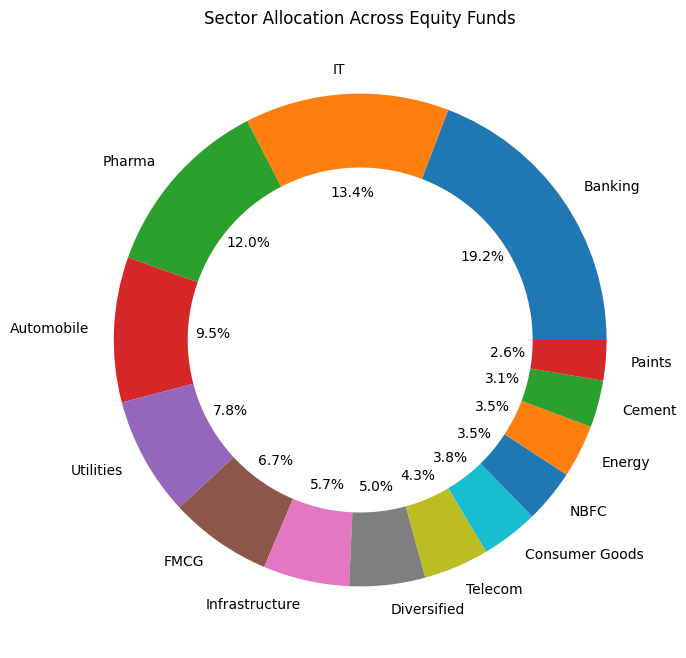

In [92]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,8))

plt.pie(
    sector_data,
    labels=sector_data.index,
    autopct="%1.1f%%"
)

# Create donut hole
centre_circle = plt.Circle((0,0), 0.70, fc="white")
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title("Sector Allocation Across Equity Funds")

plt.show()

In [93]:
plt.savefig(
    "../reports/sector_allocation_donut.png",
    bbox_inches="tight"
)

<Figure size 640x480 with 0 Axes>

## Insight 11

Banking, Information Technology, and Financial Services sectors account for a significant share of mutual fund portfolio allocations, reflecting their importance in the Indian equity market.

**Chart Reference:** Sector Allocation Donut Chart (Chart 12)

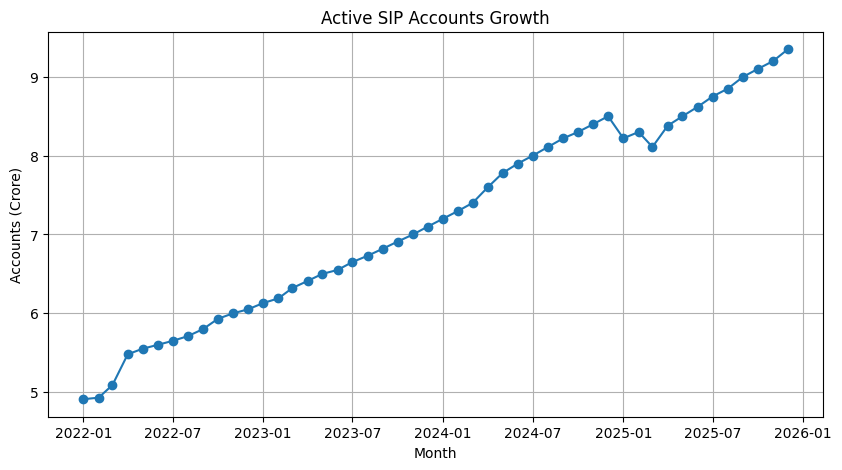

In [94]:
plt.figure(figsize=(10,5))

plt.plot(
    sip["month"],
    sip["active_sip_accounts_crore"],
    marker="o"
)

plt.title("Active SIP Accounts Growth")
plt.xlabel("Month")
plt.ylabel("Accounts (Crore)")
plt.grid(True)

plt.show()

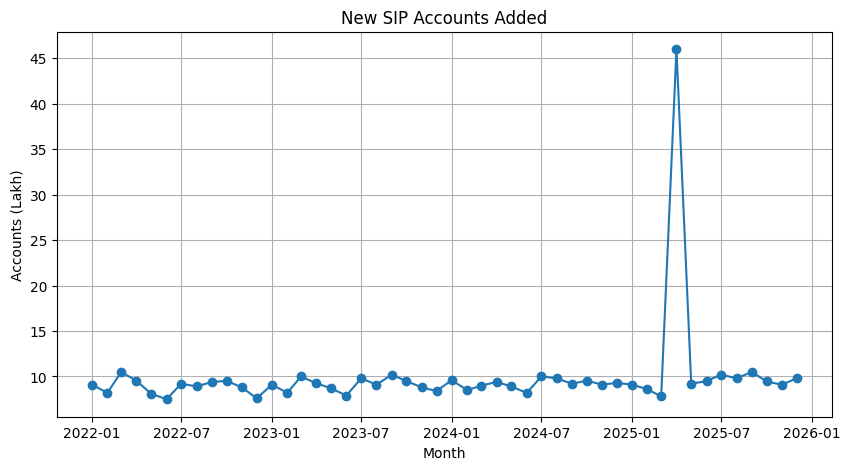

In [95]:
plt.figure(figsize=(10,5))

plt.plot(
    sip["month"],
    sip["new_sip_accounts_lakh"],
    marker="o"
)

plt.title("New SIP Accounts Added")
plt.xlabel("Month")
plt.ylabel("Accounts (Lakh)")
plt.grid(True)

plt.show()

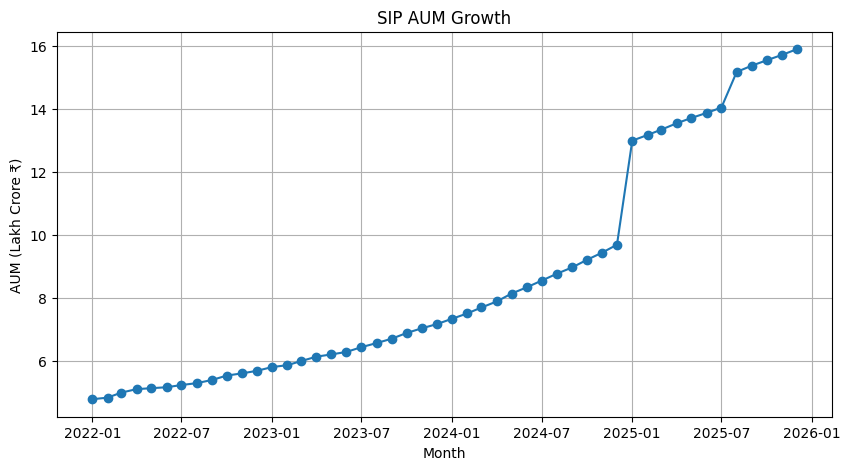

In [96]:
plt.figure(figsize=(10,5))

plt.plot(
    sip["month"],
    sip["sip_aum_lakh_crore"],
    marker="o"
)

plt.title("SIP AUM Growth")
plt.xlabel("Month")
plt.ylabel("AUM (Lakh Crore ₹)")
plt.grid(True)

plt.show()

# Conclusion

1. Mutual fund participation increased significantly between 2022 and 2025.
2. SIP inflows reached record highs during the study period.
3. SBI Mutual Fund maintained the highest AUM among major fund houses.
4. Equity-oriented funds attracted the strongest inflows.
5. Investor folio counts grew consistently, indicating expanding retail participation.
6. Most mutual funds showed positive return correlations due to common market influences.
7. Banking and Information Technology sectors received the largest portfolio allocations.

In [1]:
print("Hello")

Hello


In [2]:
print("Kernel Working")

Kernel Working


In [3]:
plt.figure(figsize=(8,4))
plt.plot(sip["month"], sip["sip_inflow_crore"])
plt.title("SIP Inflow Trend")
plt.show()

NameError: name 'plt' is not defined

In [4]:
import matplotlib.pyplot as plt

print("Matplotlib loaded")

Matplotlib loaded


In [5]:
import matplotlib.pyplot as plt

In [6]:
plt.figure(figsize=(8,4))
plt.plot(sip["month"], sip["sip_inflow_crore"])
plt.title("SIP Inflow Trend")
plt.show()

NameError: name 'sip' is not defined

<Figure size 800x400 with 0 Axes>